# Object Detection (YOLO) - [People, Cats & Dogs]
---------------
This Jupyter Notebook walks you through how to use this Python project (Tensorflow & Keras) to do object detection (YOLO) on the provided datasets. In this case, I have trained the models to do object detection on images of people, cats and dogs.

In [1]:
# import statements
import os
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"]='true'

import cv2
import random
import numpy as np
import timeit
import datetime
import tensorflow as tf
from tqdm import tqdm
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split

from tensorflow.keras import Model
from tensorflow.keras.layers import Layer, Conv2D, BatchNormalization, LeakyReLU, MaxPooling2D, Input, Reshape, Rescaling
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from yolo import *

### The /datasets/ Folder
This project has a datasets folder which contains the datasets that can be used for training the object detection models. Each /datasets/ subdirectory holds a dataset and each dataset folder, in turn, has an /images/ and an /annotations/ folder. The images are naturally stored in the /images/ subdirectory and the annotations are stored in the /annotations/ subdirectory. The annotations are stored in PASCAL VOC XML format. You can easily add, remove, or replace datasets to adjust the scope of the object detection.

In [2]:
# list the datasets present in the datasets folder
datasets = os.listdir(os.getcwd() + '/datasets/')

print('Available Datasets:')
datasets

Available Datasets:


['Asirra Cats vs Dogs Object Detection Dataset',
 'Cats and Dogs for Object Detection',
 'Person Face Detection']

In [3]:
# choose the datasets you want to include in model training
# !!! note that you can provide a subset of all the available datasets !!!
included_datasets = ['Asirra Cats vs Dogs Object Detection Dataset', 
                     'Cats and Dogs for Object Detection', 
                     'Person Face Detection']

print('Included Datasets:')
included_datasets

Included Datasets:


['Asirra Cats vs Dogs Object Detection Dataset',
 'Cats and Dogs for Object Detection',
 'Person Face Detection']

In [4]:
# combine the datasets
X, Y = combine_datasets(included_datasets)

print('Sample of Combined Dataset:')
print('')
for x in random.sample(X, 10):
    print('/'.join(x.split('/')[-3:]))

Sample of Combined Dataset:

Person Face Detection/images/16_Award_Ceremony_Awards_Ceremony_16_274.jpg
Asirra Cats vs Dogs Object Detection Dataset/images/Cats_Test3516.png
Asirra Cats vs Dogs Object Detection Dataset/images/Cats_Test1982.png
Asirra Cats vs Dogs Object Detection Dataset/images/Cats_Test3598.png
Cats and Dogs for Object Detection/images/Persian_100.jpg
Cats and Dogs for Object Detection/images/British_Shorthair_155.jpg
Asirra Cats vs Dogs Object Detection Dataset/images/Cats_Test2018.png
Person Face Detection/images/9_Press_Conference_Press_Conference_9_592.jpg
Asirra Cats vs Dogs Object Detection Dataset/images/Cats_Test1693.png
Cats and Dogs for Object Detection/images/Egyptian_Mau_151.jpg


In [5]:
# TRAIN-VALIDATION SPLIT
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.05, random_state=42)

if isinstance(X_train, list):
    print('X_train size: ', str(len(X_train)))
    print('Y_train size: ', str(len(Y_train)))
    print('X_test size: ', str(len(X_test)))
    print('Y_test size: ', str(len(Y_test)))
else:
    print('X_train shape: ', str(X_train.shape))
    print('Y_train shape: ', str(Y_train.shape))
    print('X_test shape: ', str(X_test.shape))
    print('Y_test shape: ', str(Y_test.shape))

X_train size:  9386
Y_train size:  9386
X_test size:  495
Y_test size:  495


In [6]:
# Search through the dataset and find all the class labels.
# The class labels hyperparameter (CLASSES) can be a subset of all the class labels 
# present within the dataset as they will be filtered out
CLASSES = get_class_labels(Y) 
print('CLASSSES: ' + str(CLASSES))

100%|████████████████████████████████████████████████████████████████████████████| 9881/9881 [00:01<00:00, 7072.64it/s]

CLASSSES: ['cat', 'dog', 'person']


## Inspecting Dataset
--------------------------
It is important to inspect the dataset characteristics that can influence the performance of the object detection model.

#### Class Label Distribution
Evaluating a class label distribution can help us gauge whether we are dealing with class label imbalance, which could lead the model to predict the overrepresented class labels more often than we want (after all it would be the fastest way for the model to reduce its class loss significantly).

#### Image Width-to-Height Ratio Distribution
Furthermore, examining a width-to-height ratio distribution can help with determining which model input dimensions are optimal. We want to minimize image and thus also object distortions due to resizing, because it makes it more challenging for the model to extract features that help to fit and generalize from the data.

#### Visual Inspection
Visually inspecting the data and the corresponding annotations is the most important of all. Only by going through multiple samples of the data can we judge the presence of anomalies. Inconsistent annotation labelling in the way objects are labelled or leaving out objects all together can severly hamper the model's ability to fit the data.

100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 9255.66it/s]


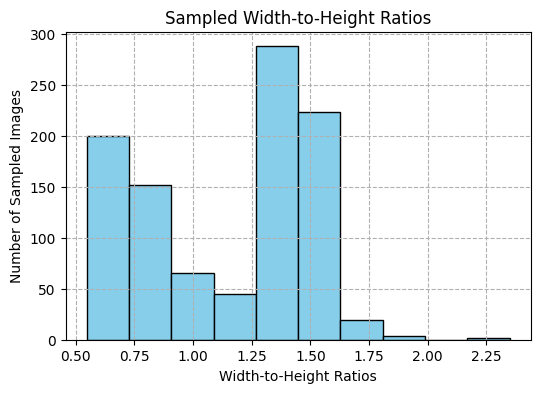

In [7]:
# Sample Width-to-Height Ratios
width_to_height_ratios = sample_width_to_height_ratios(xml_filenames = Y, sample_size = 1000)

plt.figure(figsize = (6,4))
plt.hist(width_to_height_ratios, color = 'skyblue', edgecolor='black')
plt.title('Sampled Width-to-Height Ratios')
plt.xlabel('Width-to-Height Ratios')
plt.ylabel('Number of Sampled Images')
plt.grid(True, linestyle = '--')

100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 9283.87it/s]


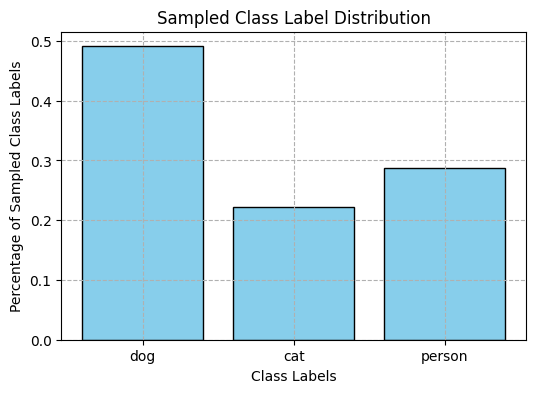

In [8]:
# Sample Class Distribution
class_distribution = sample_class_label_distribution(xml_filenames = Y, sample_size = 1000, classes = CLASSES)

plt.figure(figsize = (6,4))
plt.bar(class_distribution.keys(), class_distribution.values(), color = 'skyblue', edgecolor='black')
plt.title('Sampled Class Label Distribution')
plt.xlabel('Class Labels')
plt.ylabel('Percentage of Sampled Class Labels')
plt.grid(True, linestyle = '--')

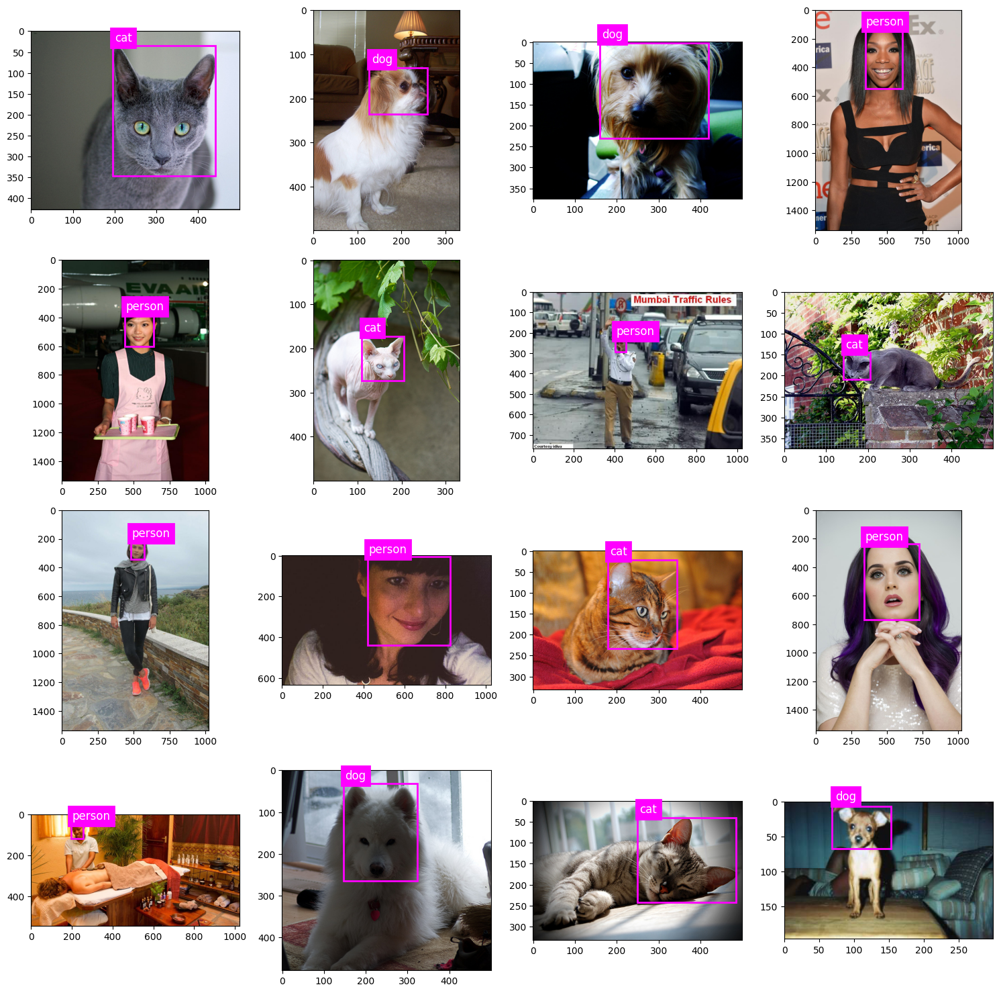

In [9]:
# VISUAL INSPECTION OF DATA SAMPLES
plt.figure(figsize = (15, 15))
sampled_indices = random.sample(range(len(X)), 16)

for i in range(0, 16, 1):
    ax = plt.subplot(4, 4, i+1)

    show_sample(xml_filename = Y[sampled_indices[i]],
                img_filename = X[sampled_indices[i]],
                formatting = {'box_border_color': 'fuchsia',
                              'box_border_linewidth': 2,
                              'box_border_linestyle': '-',
                              'box_filled_in': False,
                              'alpha': None,
                              'label_fontsize': 12.0,
                              'label_color': 'white',
                              'label_background_color': 'fuchsia',
                              'label_border_color': 'fuchsia',
                              'label_border_width': 2,
                              'label_border_style': '-',
                              'label_padding': None})
    pass
plt.tight_layout()
plt.show()

## Bounding Box Anchors
-------------------------------------
The YOLO object detection algorithm downsamples images to an output feature map. Objects are assigned to a grid (within this output feature map) in accordance to the object's mid-point. In the original model (YOLOv1), only one object could be assigned to each grid and the dimensions of the bounding boxes within each grid were directly inferred from data. Convergence is slow and difficult because bounding box dimensions were randomly initialized without good priors as a starting off point. Additionally, this earliest version of the algorithm could not detect multiple objects whose mid-points happened to fall within the same grid.

The YOLOv2 paper elaborates on the improvements as "*we ... decouple the class prediction mechanism from the spatial location and instead predict class and objectness for every anchor box*". We use bounding box dimension clustering to find good priors, which we assign to the anchors. The model predicts offsets w.r.t. these anchor dimensions. 

First, we investigate how far we can keep increasing the number of anchors before we see diminishing returns in mean IoU (overlap) between bounding boxes and anchors, while still trying to keep down model complexity and computational load. In other words, we try to establish a good value of k for our k-means algorithm. Consequently, using k-means, we find the best values for our anchor dimensions. 

100%|████████████████████████████████████████████████████████████████████████████| 9881/9881 [00:01<00:00, 8855.67it/s]


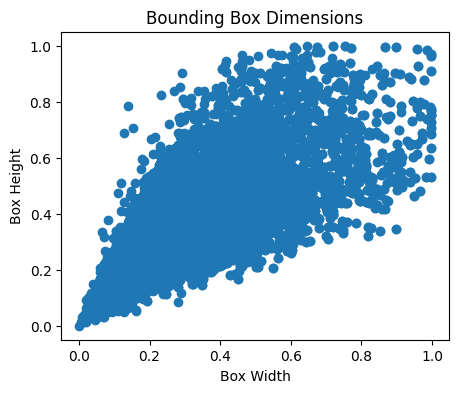

In [10]:
# Bounding Box Clustering
bbox_widths, bbox_heights = get_bounding_box_dimensions(xml_filenames = Y, classes = CLASSES)

plt.figure(figsize = (5,4))
plt.title('Bounding Box Dimensions')
plt.xlabel('Box Width')
plt.ylabel('Box Height')
plt.scatter(bbox_widths, bbox_heights)
plt.show()

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:02<00:00,  9.35it/s]


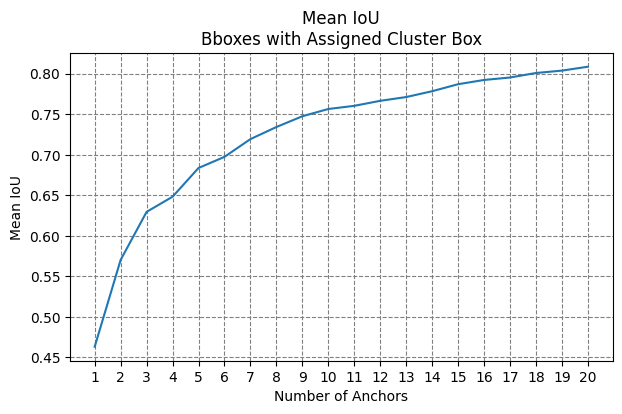

In [11]:
# evaluate which number of anchors we neeed to choose to get the right trade-off between mean IoU with bounding boxes 
# and computational load
n = 20
mean_ious = mean_IoU_by_number_of_anchors(n = n, bbox_widths = bbox_widths, bbox_heights = bbox_heights)

plt.figure(figsize = (7,4))
plt.plot(range(1,n+1), mean_ious)
plt.xticks(range(1,n+1))
plt.grid(color='grey', linestyle='--')
plt.title('Mean IoU\nBboxes with Assigned Cluster Box')
plt.xlabel('Number of Anchors')
plt.ylabel('Mean IoU')
plt.show()

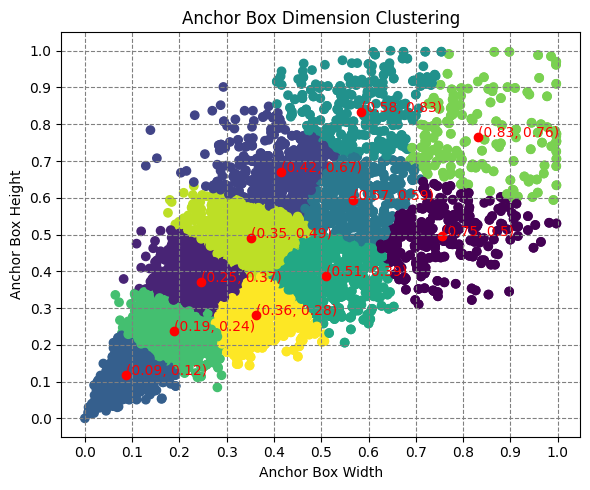

ANCHOR BOX CLUSTERS (HEIGHT, WIDTH)
Coordinates are image relative [0,1]
[[0.49549193 0.75476744]
 [0.37106579 0.2458214 ]
 [0.6690537  0.41516969]
 [0.11677339 0.08788536]
 [0.59462363 0.56655879]
 [0.8342357  0.58354624]
 [0.38717068 0.50928419]
 [0.23788531 0.18836119]
 [0.76449413 0.83205063]
 [0.49031123 0.35122645]
 [0.28179135 0.36144015]]


In [12]:
# based on the above analysis, choose a number of anchors at which we start to see diminished returns on mean IoU.
centers, labels = find_anchors(n = 11, bbox_heights = bbox_heights, bbox_widths = bbox_widths)

plt.figure(figsize = (6,5))
plt.grid(color='grey', linestyle='--')
plt.title('Anchor Box Dimension Clustering')
plt.xlabel('Anchor Box Width')
plt.ylabel('Anchor Box Height')
plt.xticks(np.arange(0, 1.1, 0.1))
plt.yticks(np.arange(0, 1.1, 0.1))
plt.scatter(bbox_widths, bbox_heights, c = labels)
plt.scatter(centers[:,1], centers[:,0], c = 'red')

for i in range(centers.shape[0]):
    plt.text(x = centers[i,1], y = centers[i,0], 
             s = '(' + str(np.round(centers[i,1], 2)) + ', ' + str(np.round(centers[i,0], 2)) + ')',
             c = 'red')
plt.tight_layout()
plt.show()

print('ANCHOR BOX CLUSTERS (HEIGHT, WIDTH)')
print('Coordinates are image relative [0,1]')
ANCHORS = centers
print(ANCHORS)

In [13]:
# HYPERPARAMETERS
params = {'IMG_H': 416, # model input: image height
          'IMG_W': 416, # model input: image width
          'CHANNELS': 3, # model input: image color channels
          'GRID_H': 13, # model output: number of vertical grids
          'GRID_W': 13, # model output: number of horizontal grids
          'BATCH_SIZE': 8, # batch size for training
          'BUFFER': 50, # maximum number of objects (ground truth bounding boxes) per batch
          'ANCHORS': ANCHORS, # anchor dimensions clusters (image relative)
          'CLASSES': CLASSES} # class labels

# scale up anchor dimensions from image relative [0,1] to grid relative [0,GRID_H/W]
params['ANCHORS'] = params['ANCHORS'] * np.array([params['GRID_H'], params['GRID_W']])

In [14]:
# IMPORTANT: we need to convert the xml annotations to a txt format in order to allow reading by 
# tensorflow API (take advantage of graph speed-up when building our data pipeline)
create_txt_annotations()

delete existing [Asirra Cats vs Dogs Object Detection Dataset] folder with text annotations...
creating new [Asirra Cats vs Dogs Object Detection Dataset] folder for text annotations...
creating text annotations for the [Asirra Cats vs Dogs Object Detection Dataset] folder...
delete existing [Cats and Dogs for Object Detection] folder with text annotations...
creating new [Cats and Dogs for Object Detection] folder for text annotations...
creating text annotations for the [Cats and Dogs for Object Detection] folder...
delete existing [Person Face Detection] folder with text annotations...
creating new [Person Face Detection] folder for text annotations...
creating text annotations for the [Person Face Detection] folder...


## Preprocessing With or Without Data Augmentation
-----------
### Preprocessing
"*Our system divides the input image into an S x S grid. If the center of an object falls into a grid cell, that grid cell is responsible for detecting that object (Redmon et al.).*" Each grid cell predicts the offset dimensions for each anchor within that grid and their corresponding confidence and class scores. The confidence scores reflect how confident the model is that the object should be assigned to the grid-anchor pairing.

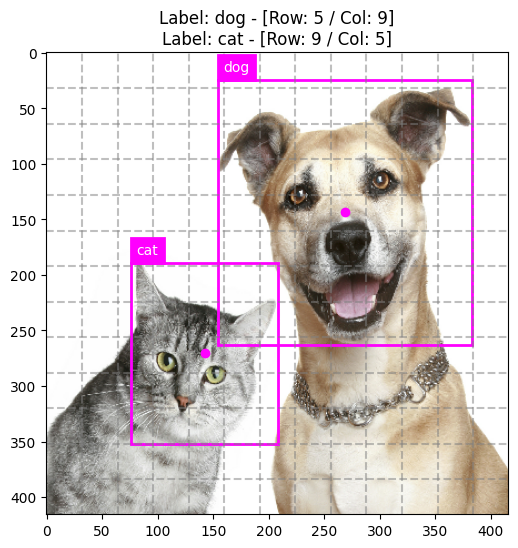

In [14]:
# preprocess (function uses only tensorflow API)
img, lbl = preprocess_tf(filename = X[0], 
                         tar_h = params['IMG_H'], tar_w = params['IMG_W'], 
                         grid_h = params['GRID_H'], grid_w = params['GRID_W'],
                         channels = params['CHANNELS'],
                         anchors = params['ANCHORS'], classes = params['CLASSES'])

# show results from preprocessing
fig = plt.figure(figsize = (6,6))  
show_preprocessed_sample(img = img, 
                         lbl = lbl, 
                         params = params, 
                         formatting = {'box_border_color': 'fuchsia',
                                       'box_border_linewidth': 2,
                                       'box_border_linestyle': '-',
                                       'box_filled_in': False,
                                       'alpha': None,
                                       'label_fontsize': 10.0,
                                       'label_color': 'white',
                                       'label_background_color': 'fuchsia',
                                       'label_border_color': 'fuchsia',
                                       'label_border_width': 2,
                                       'label_border_style': '-',
                                       'label_padding': None,
                                       'grid_color': 'gray',
                                       'grid_linestyle': '--',
                                       'grid_line_alpha': 0.5})

### Data Augmentation
The original YOLOv1 paper also stated "*To avoid overfitting we use dropout and extensive data augmentation*" (Redmon et al.). Data augmentation helps the model generalize from the training data to 'unseen' test data. Without augmentation, sufficiently sophisticated models can simply "memorize" specific training examples instead of learning how to recognize and locate the objects within the image based on object features.

Implementing image augmentation by adjusting the factors for things like noise, contrast, brightness and blur are fairly straightforward as they do not involve changing the location of the objects within the image and thus changing the bounding box coordinates for the model target labels. However, introducing random translations will change the location of the objects relative to the resulting image, which makes it a little more involved.

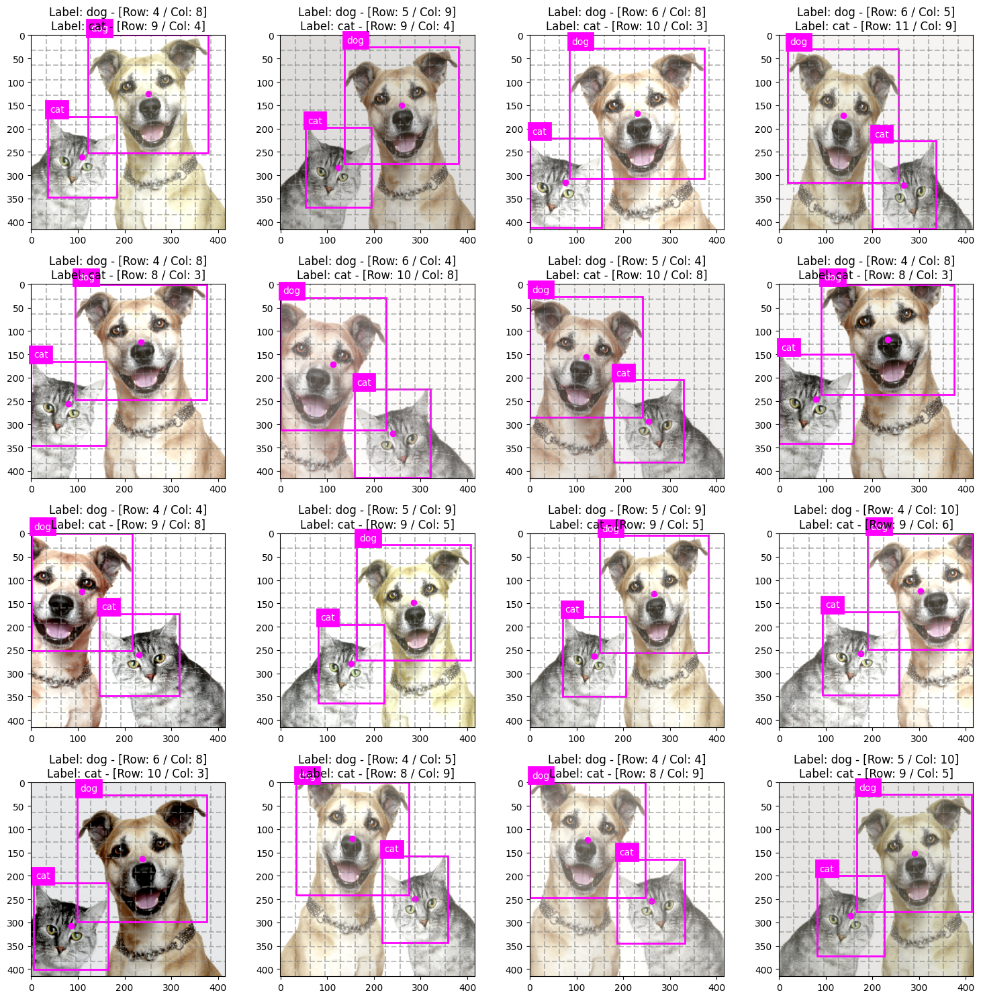

In [15]:
# preprocess an image-label pair multiple times with augmentation and show results 
plt.figure(figsize = (15,15))
for c in range(0, 16, 1):
    ax = plt.subplot(4, 4, c+1)
#     img, lbl = preprocess_with_augmentation_tf(filename = X[0], 
#                                                tar_h = params['IMG_H'], tar_w = params['IMG_W'], 
#                                                grid_h = params['GRID_H'], grid_w = params['GRID_W'],
#                                                channels = params['CHANNELS'],
#                                                anchors = params['ANCHORS'], classes = params['CLASSES'],
#                                                translation = 0.2, contrast = 0.3, brightness = 0.15, hue = 0.05)
    
    # the above tensorflow preprocessing with augmentation function breaks down to the following components
    
    # Component 1: reading in the data
    img, lbl = read_data(filename = X[0], tar_h = params['IMG_H'], tar_w = params['IMG_W'], channels = params['CHANNELS'])
    
    # Component 2: perform augmentation operations
    img, lbl = augmentation(img = img, lbl = lbl, 
                            tar_h = params['IMG_H'], tar_w = params['IMG_W'], 
                            translation = 0.2, contrast = 0.3, brightness = 0.15, hue = 0.05)
    
    # Component 3: encode YOLO label
    img, lbl = encode_label(img = img, boxes = lbl, 
                            grid_h = params['GRID_H'], grid_w = params['GRID_W'], 
                            anchors = params['ANCHORS'], classes = params['CLASSES'])
    
    # show results from preprocessing with augmentation
    show_preprocessed_sample(img = img, 
                             lbl = lbl, 
                             params = params, 
                             formatting = {'box_border_color': 'fuchsia',
                                           'box_border_linewidth': 2,
                                           'box_border_linestyle': '-',
                                           'box_filled_in': False,
                                           'alpha': None,
                                           'label_fontsize': 10.0,
                                           'label_color': 'white',
                                           'label_background_color': 'fuchsia',
                                           'label_border_color': 'fuchsia',
                                           'label_border_width': 2,
                                           'label_border_style': '-',
                                           'label_padding': None,
                                           'grid_color': 'gray',
                                           'grid_linestyle': '--',
                                           'grid_line_alpha': 0.5})
    pass
    
plt.tight_layout()
plt.show()

## YOLO Object Detection Model
---------------------------
This project uses many of the elements from the YOLOv2 paper, such as the input-output encoding, bounding box anchors, batch normalization, and convolutional layers instead of fully-connected output layers. However, this project has been set up to be flexible in the choices made with regard to model architecture. Feature extractor backbones can be easily interchanged and the network configuration can be adjusted to however one sees fit.

#### MODEL (FEATURE EXTRACTOR) BACKBONE
"*Feature Extractors for object detection are modules used to construct features that can be used for detecting objects. They address issues such as the need to detect multiple-sized objects in an image (and the need to have representations that are suitable for the different scales).*" (paperswithcode.com)

It is often best to pre-train these modules on a classification task involving images that feature the same objects that we are interested in detecting. It is often much easier to find or create larger datasets for classification than for detection tasks, as there is very little to no annotation work involved with classification. Preferably the classification and detection datasets are similar in ways that make it easier for the backbone model to learn "useful" generalizable features. Some of these ways involve pose, angle, lighting, clarity, etc.

In [16]:
# PRE-TRAINED FEATURE EXTRACTOR BACKBONE
vgg16 = tf.keras.applications.VGG16(include_top = False, 
                                    weights = 'imagenet', 
                                    input_shape = (params['IMG_H'], params['IMG_W'], params['CHANNELS']))

i = tf.keras.layers.Input([params['IMG_H'], params['IMG_W'], params['CHANNELS']], name = 'backbone_input')
x = tf.multiply(i, 255.) # preprocessing functions return standardized image pixels [0,1] --> need to be upscaled to [0,255]
x = tf.keras.applications.vgg16.preprocess_input(x)
x = vgg16(x)

backbone = tf.keras.Model(inputs=[i], outputs=[x], name = 'VGG16')
backbone.trainable = False # we freeze the backbone's weights

In [17]:
# DETECTION MODEL (BACKBONE FEATURE EXTRACTOR + DETECTION HEAD)
model = YOLO(params = params,
             layers = [backbone,
                       conv_batchnorm_lkyrelu(filters = 512, kernels = 3, strides = (1,1), name = "block_1"),
                       conv_batchnorm_lkyrelu(filters = 1024, kernels = 3, strides = (1,1), name = "block_2"),
                       conv_batchnorm_lkyrelu(filters = 1024, kernels = 3, strides = (1,1), name = "block_3"),
                       conv_batchnorm_lkyrelu(filters = 512, kernels = 3, strides = (1,1), name = "block_4"),
                       conv_batchnorm_lkyrelu(filters = 256, kernels = 3, strides = (1,1), name = "block_5")
                       ],
               name = 'YOLO')

model.build(input_shape = (None, params['IMG_H'], params['IMG_W'], params['CHANNELS']))
model.summary()

Model: "YOLO"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 VGG16 (Functional)          (None, 13, 13, 512)       14714688  
                                                                 
 block_1 (conv_batchnorm_lky  (None, 13, 13, 512)      2361344   
 relu)                                                           
                                                                 
 block_2 (conv_batchnorm_lky  (None, 13, 13, 1024)     4722688   
 relu)                                                           
                                                                 
 block_3 (conv_batchnorm_lky  (None, 13, 13, 1024)     9441280   
 relu)                                                           
                                                                 
 block_4 (conv_batchnorm_lky  (None, 13, 13, 512)      4720640   
 relu)                                                        


## Data Input Pipeline (tf.Data)
---------------------------------

"*[Eager Execution] means TensorFlow operations are executed by Python, operation by operation, and return results back to Python. While eager execution has several unique advantages, graph execution enables portability outside Python and tends to offer better performance. Graph execution means that tensor computations are executed as a TensorFlow graph, sometimes referred to as a tf.Graph.*" (tensorflow.org)

"*Graphs can speed up your code, but the process of creating them has some overhead. For some functions, the creation of the graph takes more time than the execution of the graph. This investment is usually quickly paid back with the performance boost of subsequent executions, but it's important to be aware that the first few steps of any large model training can be slower due to tracing.*" (tensorflow.org)

It makes sense that we do not only need to look at converting the actual model into a Tensorflow graph but also the operations that deliver the data to the model. If we do not, we are limited by the speed at which we preprocess and deliver the input data (bottleneck).

In [20]:
def eager_vs_graph_execution(n_s):

    # list to store performance lifts
    lift = []
    
    # create a graph for the preprocess function
    preprocess_tf_graph = tf.function(preprocess_tf)
    
    for n in tqdm(n_s):
        # evaluating eager execution speed of a numpy preprocess function 
        eager_exec_time = timeit.timeit(lambda: preprocess_np(image = X[0], label = Y[0], params = params), number = n)

        # evaluating graph execution speed of a tensorflow preprocess function
        graph_exec_time = timeit.timeit(lambda: preprocess_tf_graph(filename = X[0], 
                                                                    tar_h = params['IMG_H'], tar_w = params['IMG_W'], 
                                                                    grid_h = params['GRID_H'], grid_w = params['GRID_W'],
                                                                    channels = params['CHANNELS'],
                                                                    anchors = params['ANCHORS'], classes = params['CLASSES']), number = n)
        
        lift.append(eager_exec_time/graph_exec_time)
        pass
    
    return lift, n_s

In [21]:
performance_lifts, n_s = eager_vs_graph_execution(n_s = np.arange(1,20,1))

100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:06<00:00,  2.86it/s]


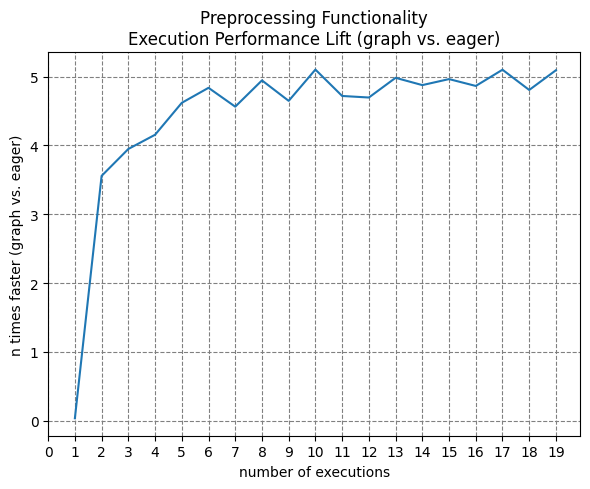

In [22]:
plt.figure(figsize = (6,5))
plt.plot(n_s, performance_lifts)
plt.title('Preprocessing Functionality\nExecution Performance Lift (graph vs. eager)')
plt.xlabel('number of executions')
plt.ylabel('n times faster (graph vs. eager)')
plt.xticks(range(0,np.max(n_s)+1,1))
plt.grid(color='grey', linestyle='--')
plt.tight_layout()
plt.show()

The plot above beautifully demonstrates how, after tracing has been completed (on the first iteration), execution times for graph functions are multiple times faster than numpy operations. Exact numbers would probably depend on the piece of code executed & the hardware it is run on. 

### Configuring Data Pipeline

When configuring the data pipeline there are a couple of best practices we can aim to adhere to:

- Ideally we execute pipeline operations that open and read (image) data only once (before the first epoch) and then store the data into memory (cache). Clearly, this is only an option if the resulting dataset fits into memory. Additionally, we need to make sure that there is homogeneity when it comes to the individual data points.

- Preferably, we would like to do as much preprocessing/augmentation after the data has been batched so we can take advantage of vectorization. Unfortunately, that is very difficult to achieve here as we are dealing with a variable number of bounding boxes, so we will not rely on this practice.

We will compare the performance of 4 different data pipelines over the first 5 epochs:
- pipeline 1: eagerly executed numpy generator (extending keras.utils.Sequence)
- pipeline 2: single graph preprocessing function (no augmentation / not cached in memory)
- pipeline 3: single graph preprocessing with augmentation function (executed after caching and before batching)
- pipeline 4: multiple graph functions for reading (placed before caching), augmenting and encoding data (placed after caching)


In [18]:
# CONFIGURING THE DATA PIPELINE
batch_size = params['BATCH_SIZE']
buffer_size = len(X)

# initialize dataset by slicing filepaths
train_ds = tf.data.Dataset.from_tensor_slices(X_train)
test_ds = tf.data.Dataset.from_tensor_slices(X_test)

# NOTES:
# 1.) Preferably vectorize preprocessing functions over batches (by placing map after batch). tf.io.read_file does not vectorize!
# 2.) Images need to be resized before being batched or cached (same dimensions).
# 3.) Preprocessing before cache: make sure resulting dataset fits into memory.

###############################

# pipeline 2 config:
# single graph pre-processing without augmentation (executed once at first epoch and then cached into memory)
def config_train_pipeline_2(ds):
    ds = (ds.cache() # store in memory
            .shuffle(buffer_size = buffer_size) # shuffle
            .map(lambda x: preprocess_tf(filename = x, 
                                         tar_h = params['IMG_H'], tar_w = params['IMG_W'], 
                                         grid_h = params['GRID_H'], grid_w = params['GRID_W'],
                                         channels = params['CHANNELS'],
                                         anchors = params['ANCHORS'], classes = params['CLASSES']), 
                 num_parallel_calls = tf.data.AUTOTUNE) # read-in images and encode labels
            .batch(batch_size) # batch
            .prefetch(buffer_size = tf.data.AUTOTUNE))
    return ds

# pipeline 3 config:
# single graph pre-processing without augmentation (executed once at first epoch and then cached into memory)
# NOTE that we have to put the mapping functionality with augmentation after the caching, otherwise
# the images and labels are augmented once and then not again.
def config_train_pipeline_3(ds):
    ds = (ds.cache() # store in memory
            .shuffle(buffer_size = buffer_size) # shuffle
            .map(lambda x: preprocess_with_augmentation_tf(filename = x,
                                                           tar_h = params['IMG_H'], tar_w = params['IMG_W'], 
                                                           grid_h = params['GRID_H'], grid_w = params['GRID_W'],
                                                           channels = params['CHANNELS'],
                                                           anchors = params['ANCHORS'], classes = params['CLASSES'],
                                                           translation = 0.2, contrast = 0.3, brightness = 0.15, hue = 0.05), 
                 num_parallel_calls = tf.data.AUTOTUNE) # read-in images and encode labels
            .batch(batch_size) # batch
            .prefetch(buffer_size = tf.data.AUTOTUNE))
    return ds

# pipeline 4 config:
# seperate graph functions for reading, augmenting and encoding data
# NOTE that we do not take advantage of the vectorization over batches because  
def config_train_pipeline_4(ds):
    ds = (ds.map(lambda x: read_data(filename = x, tar_h = params['IMG_H'], tar_w = params['IMG_W'], channels = params['CHANNELS']), 
                 num_parallel_calls = tf.data.AUTOTUNE) # read-in images and annotations
            .cache() # store in memory
            .shuffle(buffer_size = buffer_size) # shuffle
            .map(lambda x, y: augmentation(img = x, lbl = y, 
                                           tar_h = params['IMG_H'], tar_w = params['IMG_W'], 
                                           translation = 0.2, contrast = 0.3, brightness = 0.15, hue = 0.05), 
                 num_parallel_calls = tf.data.AUTOTUNE) # perform augmentation on stored images and annotations
            .map(lambda x, y: encode_label(img = x, boxes = y, 
                                           grid_h = params['GRID_H'], grid_w = params['GRID_W'], 
                                           anchors = params['ANCHORS'], classes = params['CLASSES']),
                 num_parallel_calls = tf.data.AUTOTUNE) # encode labels to YOLO format
            .batch(batch_size) # batch
            .prefetch(buffer_size = tf.data.AUTOTUNE))
    return ds

# pipeline config for test data
def config_test_pipeline(ds):
    ds = (ds.map(lambda x: preprocess_tf(filename = x, 
                                         tar_h = params['IMG_H'], tar_w = params['IMG_W'], 
                                         grid_h = params['GRID_H'], grid_w = params['GRID_W'],
                                         channels = params['CHANNELS'],
                                         anchors = params['ANCHORS'], classes = params['CLASSES']),
                 num_parallel_calls = tf.data.AUTOTUNE) # read-in images and encode labels
            .cache() # store in memory
            .shuffle(buffer_size = buffer_size) # shuffle
            .batch(batch_size) # batch
            .prefetch(buffer_size = tf.data.AUTOTUNE))
    return ds

#########################

#train_ds_pipeline_2 = config_train_pipeline_2(train_ds)
#train_ds_pipeline_3 = config_train_pipeline_3(train_ds)
train_ds_pipeline_4 = config_train_pipeline_4(train_ds)

test_ds_pipeline = config_test_pipeline(test_ds)

Here, I will skip the actual model training for all the different pipelines and go straight to a breakdown of the performance for each pipeline. 

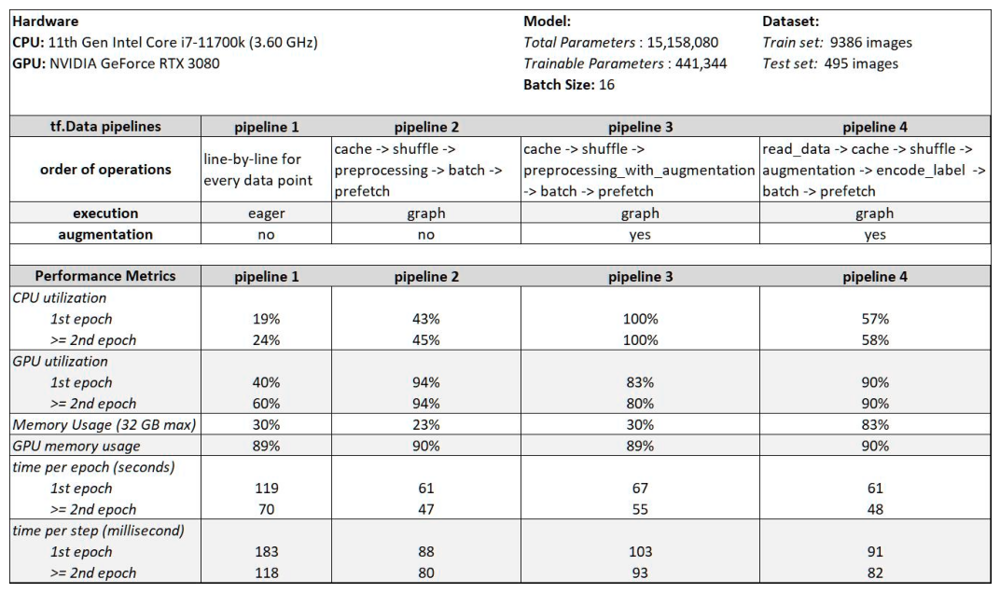

In [18]:
# show a breakdown of the data pipeline performance metrics
fig = plt.figure(figsize = (15,8))
plt.imshow(cv2.imread(os.getcwd() + '/lib/performance metrics.jpg'))
plt.axis('off')
plt.show()

### Comparing Data Pipeline Hardware Utilization & Performance

#### Pipeline 1 vs. Pipeline 2
Pipeline 1 extends the keras.utils.Sequence class to eagerly perform preprocessing on each image and each annotation file every time they are fed into the network. Some, but clearly not a lot, of the overhead might be saved in memory (30% utilization). This pipeline has low CPU utilization (24%) and relatively low GPU utilization (60%), which suggests that the bottleneck is not the hardware, but the code itself (eager execution).
Pipeline 2, in contrast, uses the tensorflow framework to trace a graph and employ hardware acceleration. Using pipeline 1 as a reference, pipeline 2 is able to utilize more of the CPU's capacity (45%). This means that the data is fed into the network much faster and the GPU can be employed at a very high utilization rate (94%), to the point that this now becomes the new bottleneck at times. Because pipeline 2 is so much more efficient, we see time per epoch and time per step decrease significantly.

#### Pipeline 2 vs. Pipeline 3
Pipeline 1 & 2 give us a beautiful way of showing the efficiency gains that graph execution can bring over eager execution as both pipelines are identical in functionality and only different in the code framework used.
Pipeline 3 takes the preprocessing functionality of pipeline 2 and simply adds the image/annotation augmentation to it. The augmentation functionality is relatively demanding from a computational standpoint. The CPU utilization is now consistenly at 100%. This means that the data pipeline, which is executed using CPU resources, has become the new bottleneck. GPU utilization (80%) has come down as the data is not fed into the network as fast as before (with pipeline 2). This can also be seen from the uptick in the time per epoch and time per step.

#### Pipeline 3 vs. Pipeline 4
Pipeline 3 has the CPU as its bottleneck. We, thus, have to look elsewhere for underutilized resources to which we can offload some of the CPU workload in pipeline 4. Pipeline 1 through 3 all have relatively low memory usage (around 30%), which means we may want to look to store the resulting dataset from expensive one-time operations (like opening and reading image data) in memory. I have pain-stakingly (considering variable number of bounding boxes) broken up the preprocessing functionality into 3 seperate functions for reading, augmenting, and encoding data. In pipeline 4, the result of the reading data function is cached into memory at the first epoch of training, meaning we have successfully offloaded the opening and reading of image and (.txt) annotation files from the CPU into memory. Compared to pipeline 3, memory utilization has significantly increased (to around 83%), the CPU bottleneck is relieved (utilization at 58%), and GPU utilization has increased again (to 90%). Even though there might still be ways of fine-tuning performance, pipeline 4 is a relatively well-balanced pipeline, which utilizes a lot of the hardware capacities. The result is a pipeline that can do preprocessing with augmentation at comparable speeds as pipeline 2 does preprocessing without augmentation. 

## Model Training
---------------------------------------
Some lessons that I have learned training YOLO object detection models:

- After the initial stage, training convergence is usually pretty slow. However, training for longer helps the model fine-tune its predictions. This leads to pretty significant performance increases when actually run on real-world examples, even though the corresponding reductions in training/validation loss might be modest.
- I advise pre-training the backbone feature extractor (classifier) seperately first and freezing these layers during the training of the overall model. This will help the model converge. At the end, you can choose to unfreeze these parts and continue training the whole network for a couple of epochs at a low learning rate to fine-tune the model.

In [19]:
# CHECKPOINT FOR SAVING WEIGHTS
# set up directory to store weights
if not os.path.exists('weights/'):
    os.makedirs('weights/')
    pass

# construct a filename
filename = (model.name + '_' + str(params['CLASSES']) + '_(' + 
            datetime.datetime.now().strftime("%x") + ').h5').replace('\'', '').replace('/', '-').replace(', ', '_')
print('Model weights will be saved under:', filename)

# CALLBACKS
checkpoint = ModelCheckpoint(filepath = 'weights/' + filename,
                             monitor = "val_loss",
                             verbose = 0, 
                             save_best_only = True, 
                             save_weights_only = True)

earlystopping = EarlyStopping(monitor = "loss",
                              patience = 10,
                              restore_best_weights = False)
    
# LEARNING RATE SCHEDULE
def custom_schedule(epoch):
    if epoch >= 0 and epoch <= 2:
        return 0.00001
    elif epoch > 2 and epoch <= 4:
        return 0.0001
    elif epoch > 4 and epoch <= 80:
        return 0.001
    elif epoch > 80:
        return 0.0001

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(schedule = custom_schedule, verbose = 0)

Model weights will be saved under: YOLO_[cat_dog_person]_(07-23-24).h5


In [20]:
# compile model
model.compile(optimizer = SGD(), loss = yolo_loss(params))

In [21]:
# load in previously trained weights
model.load_weights(os.getcwd() + "/weights/yolo_weights.h5",  by_name = True)

In [21]:
# TRAINING MODEL
epochs = 120

history = model.fit(train_ds_pipeline_4, 
                    epochs = epochs,
                    validation_data = test_ds_pipeline,
                    verbose = 1,
                    callbacks = [checkpoint, lr_scheduler])

Epoch 1/120
1174/1174 [==============================] - 116s 77ms/step - loss: 3.5114 - val_loss: 2.8614 - lr: 1.0000e-05
Epoch 2/120
1174/1174 [==============================] - 87s 74ms/step - loss: 2.4389 - val_loss: 2.1830 - lr: 1.0000e-05
Epoch 3/120
1174/1174 [==============================] - 88s 75ms/step - loss: 2.0487 - val_loss: 1.8901 - lr: 1.0000e-05
Epoch 4/120
1174/1174 [==============================] - 88s 75ms/step - loss: 1.5072 - val_loss: 1.1451 - lr: 1.0000e-04
Epoch 5/120
1174/1174 [==============================] - 88s 75ms/step - loss: 0.9952 - val_loss: 0.8667 - lr: 1.0000e-04
Epoch 6/120
1174/1174 [==============================] - 88s 75ms/step - loss: 0.6538 - val_loss: 0.4726 - lr: 0.0010
Epoch 7/120
1174/1174 [==============================] - 88s 75ms/step - loss: 0.4551 - val_loss: 0.3625 - lr: 0.0010
Epoch 8/120
1174/1174 [==============================] - 88s 75ms/step - loss: 0.3741 - val_loss: 0.3096 - lr: 0.0010
Epoch 9/120
1174/1174 [============

Epoch 70/120
1174/1174 [==============================] - 88s 75ms/step - loss: 0.0958 - val_loss: 0.0946 - lr: 0.0010
Epoch 71/120
1174/1174 [==============================] - 88s 75ms/step - loss: 0.0954 - val_loss: 0.0947 - lr: 0.0010
Epoch 72/120
1174/1174 [==============================] - 88s 75ms/step - loss: 0.0932 - val_loss: 0.0941 - lr: 0.0010
Epoch 73/120
1174/1174 [==============================] - 88s 75ms/step - loss: 0.0915 - val_loss: 0.0951 - lr: 0.0010
Epoch 74/120
1174/1174 [==============================] - 87s 74ms/step - loss: 0.0919 - val_loss: 0.0948 - lr: 0.0010
Epoch 75/120
1174/1174 [==============================] - 88s 75ms/step - loss: 0.0920 - val_loss: 0.0925 - lr: 0.0010
Epoch 76/120
1174/1174 [==============================] - 88s 75ms/step - loss: 0.0911 - val_loss: 0.0920 - lr: 0.0010
Epoch 77/120
1174/1174 [==============================] - 88s 75ms/step - loss: 0.0908 - val_loss: 0.0916 - lr: 0.0010
Epoch 78/120
1174/1174 [========================

In [22]:
# # custom save model weights
model.save_weights(os.getcwd() + "/weights/yolo_weights.h5")


# Evaluate Model Performance on Test Data
------------------------------

We use the "unseen" test data to evaluate the model's ability to generalize from the training data.

In [22]:
# PREPROCESS AND CONCATENATE ALL TEST DATA
y_imgs, y_lbls = next(iter(test_ds_pipeline))
y_hat_lbls = model.predict(x = y_imgs, verbose = 0)
y_hat_lbls = activate_and_scale_up_model_output(lbl = y_hat_lbls, params = params)

while y_imgs.shape[0] < len(X_test):
    y_imgs_, y_lbls_ = next(iter(test_ds_pipeline))
    y_hat_lbls_ = model.predict(x = y_imgs_, verbose = 0)
    y_hat_lbls_ = activate_and_scale_up_model_output(lbl = y_hat_lbls_, params = params)
    
    y_imgs = np.concatenate((y_imgs, y_imgs_), axis = 0)
    y_lbls = np.concatenate((y_lbls, y_lbls_), axis = 0)
    y_hat_lbls = np.concatenate((y_hat_lbls, y_hat_lbls_), axis = 0)
    pass

print('test images shape:         ',y_imgs.shape)
print('target test label shape:   ',y_lbls.shape)
print('predicted test label shape:',y_hat_lbls.shape)

test images shape:          (496, 416, 416, 3)
target test label shape:    (496, 13, 13, 11, 8)
predicted test label shape: (496, 13, 13, 11, 8)


### 1.) Visual Inspection

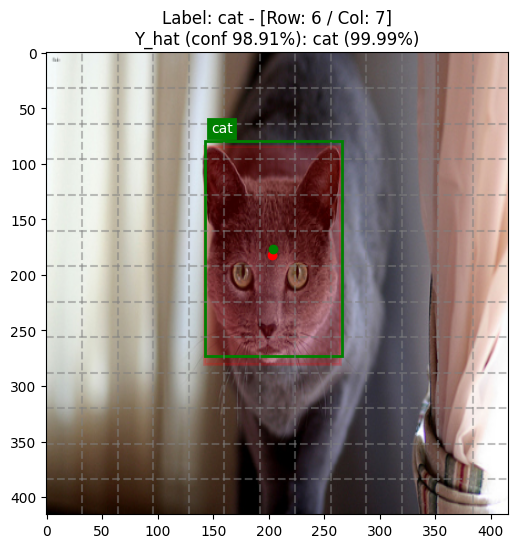

In [23]:
index = 1
fig = plt.figure(figsize = (6,6))
conf_boxes, nms_boxes = show_prediction_vs_ground_truth(x = y_imgs[index], # images
                                                        y = y_lbls[index], # target labels
                                                        y_hat = y_hat_lbls[index], # predicted labels
                                                        conf_thres = 0.8, # "objectness" confidence threshold
                                                        nms_thres = 0.3, # non-max suppression IoU threshold
                                                        params = params, # hyperparameters
                                                        formatting = {'grid_color': 'gray',
                                                                      'grid_linestyle': '--',
                                                                      'grid_line_alpha': 0.5},
                                                        gt_bbox_formatting = {'box_border_color': 'red',
                                                                              'box_border_linewidth': 2,
                                                                              'box_border_linestyle': '-',
                                                                              'box_filled_in': True,
                                                                              'alpha': 0.2,
                                                                              'label_fontsize': 0.0,
                                                                              'label_color': 'white',
                                                                              'label_background_color': 'red',
                                                                              'label_border_color': 'red',
                                                                              'label_border_width': 2,
                                                                              'label_border_style': '-',
                                                                              'label_padding': 2}, 
                                                        pred_bbox_formatting = {'box_border_color': 'green',
                                                                                'box_border_linewidth': 2,
                                                                                'box_border_linestyle': '-',
                                                                                'box_filled_in': False,
                                                                                'alpha': None,
                                                                                'label_fontsize': 10.0,
                                                                                'label_color': 'white',
                                                                                'label_background_color': 'green',
                                                                                'label_border_color': 'green',
                                                                                'label_border_width': 2,
                                                                                'label_border_style': '-',
                                                                                'label_padding': 2})

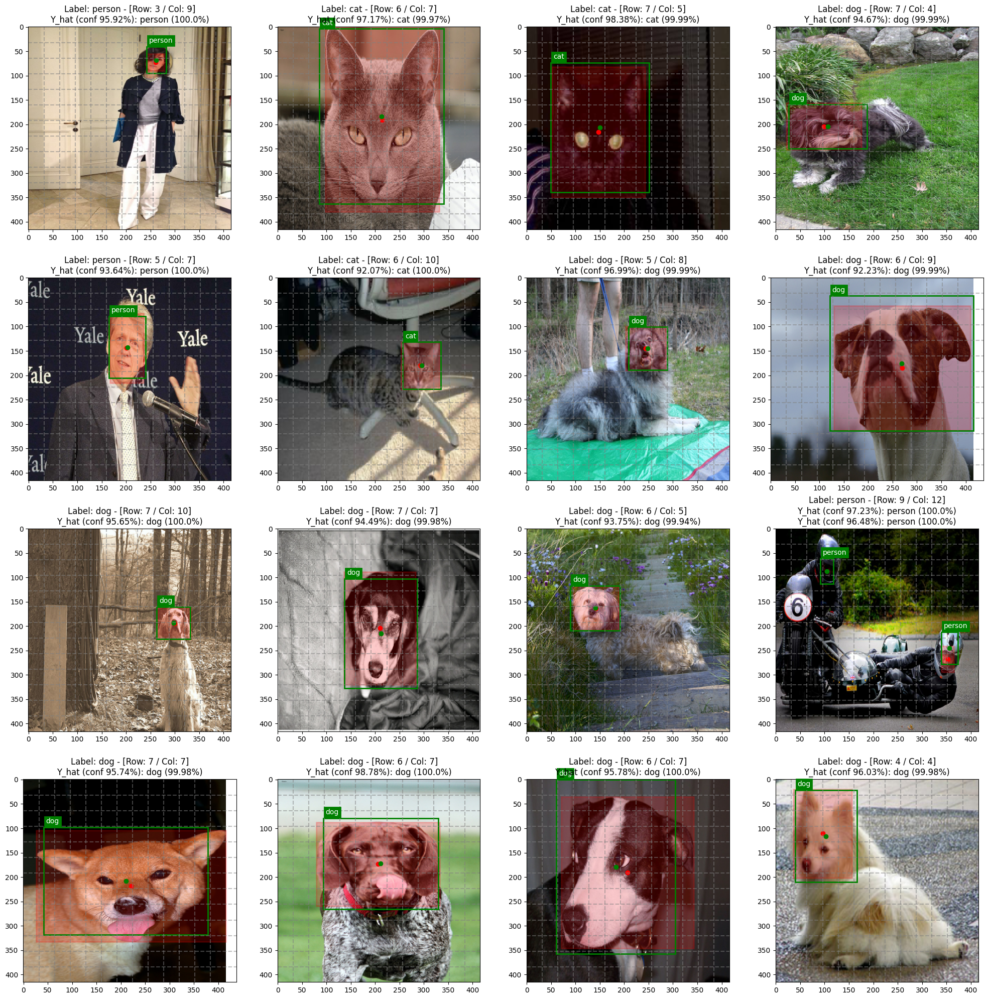

In [24]:
# SHOW MODEL PERFORMANCE ON A BATCH OF TEST DATA IMAGES
offset = 20
plt.figure(figsize = (20,20))
for i in range(0, 16, 1):
    ax = plt.subplot(4, 4, i+1)
    conf_boxes, nms_boxes = show_prediction_vs_ground_truth(x = y_imgs[i+offset], # images
                                                            y = y_lbls[i+offset], # target labels
                                                            y_hat = y_hat_lbls[i+offset], # predicted labels
                                                            conf_thres = 0.8, # "objectness" confidence threshold
                                                            nms_thres = 0.1, # non-max suppression IoU threshold
                                                            params = params, # hyperparameters
                                                            formatting = {'grid_color': 'gray',
                                                                          'grid_linestyle': '--',
                                                                          'grid_line_alpha': 0.5},
                                                            gt_bbox_formatting = {'box_border_color': 'red',
                                                                                  'box_border_linewidth': 2,
                                                                                  'box_border_linestyle': '-',
                                                                                  'box_filled_in': True,
                                                                                  'alpha': 0.2,
                                                                                  'label_fontsize': 0.0,
                                                                                  'label_color': 'white',
                                                                                  'label_background_color': 'red',
                                                                                  'label_border_color': 'red',
                                                                                  'label_border_width': 2,
                                                                                  'label_border_style': '-',
                                                                                  'label_padding': 2}, 
                                                            pred_bbox_formatting = {'box_border_color': 'green',
                                                                                    'box_border_linewidth': 2,
                                                                                    'box_border_linestyle': '-',
                                                                                    'box_filled_in': False,
                                                                                    'alpha': None,
                                                                                    'label_fontsize': 10.0,
                                                                                    'label_color': 'white',
                                                                                    'label_background_color': 'green',
                                                                                    'label_border_color': 'green',
                                                                                    'label_border_width': 2,
                                                                                    'label_border_style': '-',
                                                                                    'label_padding': 2})
    pass
plt.tight_layout()
plt.show()

## 2.) Evaluation Metrics

#### Precision-Recall Curve
"*...the higher the precision, the more confident the model is when it classifies a sample as Positive. The higher the recall, the more positive samples the model correctly classified as Positive.*

*When a model has high recall but low precision, then the model classifies most of the positive samples correctly but it has many false positives (i.e. classifies many Negative samples as Positive). When a model has high precision but low recall, then the model is accurate when it classifies a sample as Positive but it may classify only some of the positive samples.*" (blog.paperspace.com)

#### mean Average Precision (mAP)
"*The average precision (AP) is a way to summarize the precision-recall curve into a single value representing the average of all precisions... Usually, the object detection models are evaluated with different IoU thresholds where each threshold may give different predictions from the other thresholds...To calculate the mAP, start by calculating the AP for each class. The mean of the APs for all classes is the mAP.*" (blog.paperspace.com)

In [25]:
# CALCULATE THE AVERAGE PRECISIONS BY CLASS AND THE MEAN AVERAGE PRECISION (mAP)
AP_by_class, mAP_value = mAP(y = y_lbls, # target labels
                             y_hat = y_hat_lbls, # predicted labels
                             conf_thres = 0.8, # "objectness" confidence threshold
                             nms_thres = 0.1, # non-max suppression IoU threshold
                             iou_thres = 0.5, # IoU threshold for classifying a predicted bbox as a True Positive 
                             params = params) # hyperparameters

print('mean Average Precision (mAP): ' + str(np.round(mAP_value,6)))

mean Average Precision (mAP): 0.771983


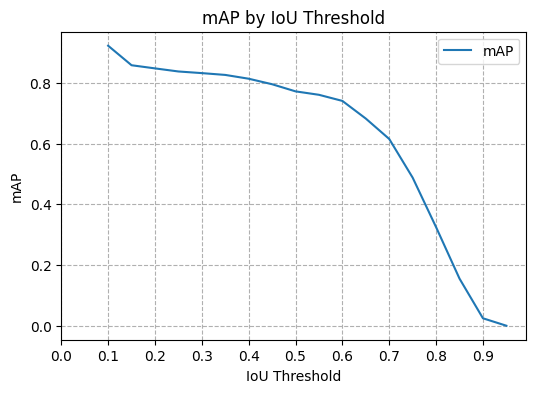

In [26]:
# CREATE mAP CURVE
iou_thresholds = np.arange(0.1,1.0,0.05)

fig = plt.figure(figsize = (6,4))
mAPs = mAP_curve(y = y_lbls, # target labels
                 y_hat = y_hat_lbls, # predicted labels
                 conf_thres = 0.8, # "objectness" confidence threshold
                 nms_thres = 0.1, # non-max suppression IoU threshold
                 iou_thresholds = iou_thresholds, # IoU thresholds for classifying a predicted bbox as a True Positive 
                 params = params) # hyperparameters

# construct the mean Average Precision curve
plt.plot(iou_thresholds, np.array(mAPs)) 
plt.xlabel('IoU Threshold')
plt.xticks(np.arange(0,1.0,0.1))
plt.ylabel('mAP')
plt.grid(linestyle = '--')
plt.title('mAP by IoU Threshold')
plt.legend(['mAP'])
plt.show()

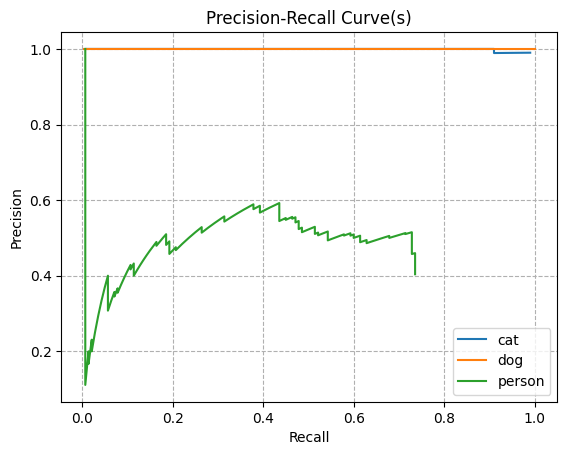

In [37]:
# PRECISION-RECALL CURVE
precision_recall_curve(AP_by_class = AP_by_class, # average precision by class
                       class_labels = CLASSES) # class labels included

## Test On Your Own Images & Videos
-----------------------------------------
Use these functions to test the model's object detection on images and .mp4 videos in the /test/ folder.

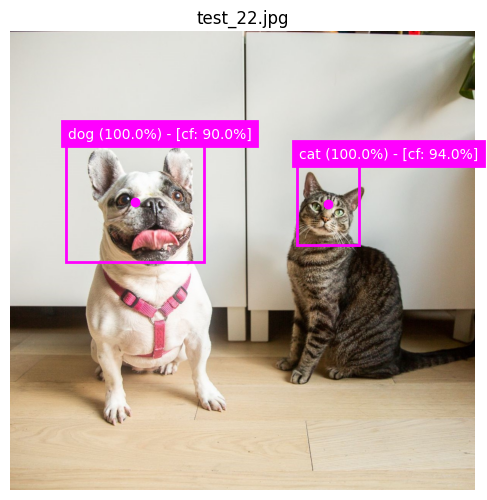

In [29]:
fig = plt.figure(figsize = (6,6))
conf_boxes, nms_boxes = predict_image(filename = 'test_22.jpg', # image filename (has to be in test/images/ folder)
                                      model = model, # model
                                      conf_thres = 0.8, # "objectness" confidence threshold
                                      nms_thres = 0.1, # non-max suppression IoU threshold
                                      params = params, # hyperparameters
                                      return_original_dimensions = True,  # return original image output dimensions or use the model's input dimensions
                                      axis_drawn = False,
                                      formatting = {'box_border_color': 'fuchsia',
                                                    'box_border_linewidth': 2,
                                                    'box_border_linestyle': '-',
                                                    'box_filled_in': False,
                                                    'alpha': None,
                                                    'label_fontsize': 10.0,
                                                    'label_color': 'white',
                                                    'label_background_color': 'fuchsia',
                                                    'label_border_color': 'fuchsia',
                                                    'label_border_width': 2,
                                                    'label_border_style': '-',
                                                    'label_padding': None,
                                                    'label_include_conf_score': True,
                                                    'grid_color': 'gray',
                                                    'grid_linestyle': '--',
                                                    'grid_line_alpha': 0.5})
                                      

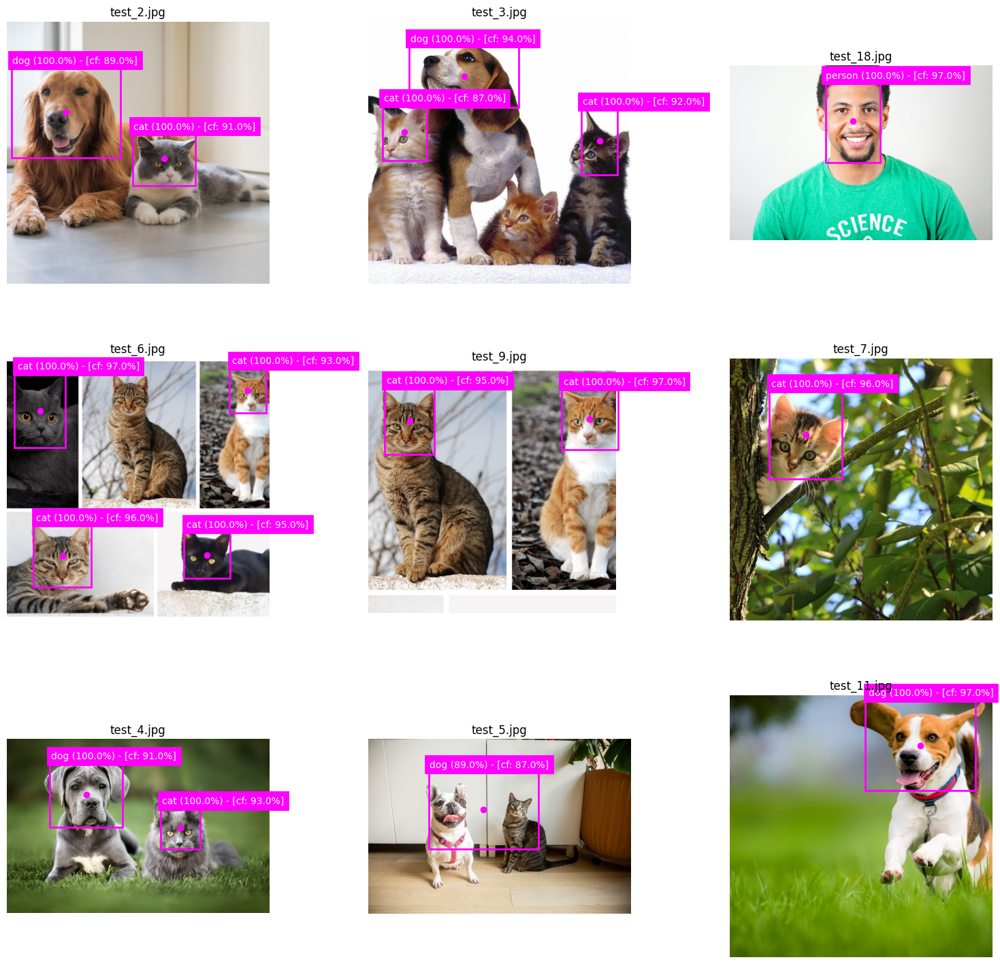

In [30]:
# TEST MODEL ON SAMPLE OF "UNSEEN" IMAGES
test_images = random.sample(os.listdir(os.getcwd() + "/test/image"), 9)

plt.figure(figsize = (15,15))
for i in range(0, 9, 1):
    ax = plt.subplot(3, 3, i+1)
    
    conf_boxes, nms_boxes = predict_image(filename = test_images[i], # image filename (has to be in test/images/ folder)
                                          model = model, # model
                                          conf_thres = 0.8, # "objectness" confidence threshold
                                          nms_thres = 0.1, # non-max suppression IoU threshold
                                          params = params, # hyperparameters
                                          return_original_dimensions = True,  # return original image output dimensions or use the model's input dimensions
                                          axis_drawn = False,
                                          formatting = {'box_border_color': 'fuchsia',
                                                        'box_border_linewidth': 2,
                                                        'box_border_linestyle': '-',
                                                        'box_filled_in': False,
                                                        'alpha': None,
                                                        'label_fontsize': 10.0,
                                                        'label_color': 'white',
                                                        'label_background_color': 'fuchsia',
                                                        'label_border_color': 'fuchsia',
                                                        'label_border_width': 2,
                                                        'label_border_style': '-',
                                                        'label_padding': None,
                                                        'label_include_conf_score': True,
                                                        'grid_color': 'gray',
                                                        'grid_linestyle': '--',
                                                        'grid_line_alpha': 0.5}) # predicted bounding boxes' color
    
    pass
plt.tight_layout()
plt.show()

In [40]:
# use model to do object detection on your own .mp4 files (results will be in /test/video/results/ folder)
frame_inference_times = predict_video(filename = 'a-couple-of-cats-in-the-snow.mp4', # .mp4 video filename (has to be in test/videos/ folder) 
                                      model = model, # YOLO model
                                      conf_thres = 0.8, # "objectness" confidence threshold
                                      nms_thres = 0.1, # non-max suppression IoU threshold
                                      params = params, # hyperparameters
                                      fps = 25, # frames-per-second
                                      folder = 'test/video/', # relative file path of test videos
                                      formatting = {'box_border_color': (0, 204, 0), # BGR color channels
                                                    'box_border_thickness': 3,
                                                    'label_font': cv2.FONT_HERSHEY_SIMPLEX,
                                                    'label_font_size': 1,
                                                    'label_font_color': (255, 255, 255), # BGR color channels
                                                    'label_font_thickness': 2,
                                                    'label_border_color': (0, 204, 0), # BGR color channels
                                                    'label_border_thickness': 2,
                                                    'label_background_color':(0, 204, 0),
                                                    'label_include_conf_score': False}) # BGR color channels

Creating video (.mp4)...


100%|████████████████████████████████████████████████████████████████████████████████| 643/643 [01:20<00:00,  7.95it/s]


# Final Remarks
--------------------------------------------------

#### Aspect Ratio, Object Distortion & Object Size
This YOLO object detection model does not do a particularly good job of detecting and sizing bounding boxes for smaller objects. Additionally, the more the input image deviates in aspect ratio from the input dimensions of the model, the less accurate the model becomes.

#### Less Accurate than Faster R-CNN
This YOLO object detector is less accurate in finding and especially in fitting the bounding boxes than the Faster R-CNN model (see my other repositories). It seems to me that the Region Proposal Network (RPN) that is part of the Faster R-CNN algorithm gives that model a more flexible, yet more accurate, target to fit. Since, when using RPN, offset variables are calculated for neighboring high IoU anchors, the model includes neighboring boxes that happen to overlap with the underlying ground truth object and also adjusts the coordinates for those boxes. The YOLO object detector, however, assigns the object to 1 anchor, in 1 grid. The remaining anchor-grid combinations are all set to 0. The result is that the YOLO model is trying to learn that there is only 1 grid-anchor pairing that is the answer, even though there might be many more predictions in the same or neighboring grids that have high overlap. You would want the model to include those predicted boxes as well and also for the model to fine-tune the coordinates of those boxes. The best way to describe it is that the Faster R-CNN tries to aim for the bulls-eye on a dart board, but is able to discern that hitting closer to the bulls-eye is better than hitting farther away. Whereas, YOLO seems to aim for the bulls-eye and cannot discern "fitness" outside of it.   

#### Data Quality
The majority of images in the datasets that this model is trained on have a relatively high resolution, sharp contrast, and objects that are generally displayed in clearly identifiable positions and poses. The quality of the results on new and "unseen" images/videos depends significantly on the degree of similarity between the properties of these images/videos and the ones within the dataset. Here, I have judged the model's performance based off of high-quality, high resolution, open-source stock images and videos. You will find the performance of the model to be noticeably less (but not poor) when you would, for example, provide it an image or video that is shot with a smartphone camera and suffers from things like blurring and over-exposure.

#### Further Improvements
Besides training the model on annotated data that the model will actually be used for (i.e. smartphone camera, security or dashboard camera footage), most of the model performance improvements would have to come from model architecture adjustments. YOLO v3 and subsequent versions work with larger and deeper models, which also employ residual connections, upsampling, increased input resolutions, and predictions at different scales. These adjustments, although computationally expensive, have shown to improve model performance, especially when detecting smaller objects.